# Persiapan Training

## Cek apakah terdapat nvcc dan gcc

In [2]:
#Catatan: Jika NVCC/GCC tidak terdeteksi maka proses training tidak akan berjalan!

# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Mar_28_02:18:24_PDT_2024
Cuda compilation tools, release 12.4, V12.4.131
Build cuda_12.4.r12.4/compiler.34097967_0
gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
Copyright (C) 2021 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



## Import Library

Library Dasar

In [3]:
from mmcv import collect_env
collect_env()

# Check MMRotate installation
import mmrotate
print(mmrotate.__version__)

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


0.3.4
2.28.2
11.8
GCC 9.3


Library Tambahan

In [4]:
import mmcv
import os
import random
import time
import matplotlib.pyplot as plt
import os.path as osp
from datetime import datetime
from mmcv import Config
from mmdet.apis import set_random_seed
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
from mmdet.apis import inference_detector, show_result_pyplot

## Download dataset dari roboflow

In [17]:
from roboflow import Roboflow
rf = Roboflow(api_key="bSj4K02UdSqagdTEh8Z5")
project = rf.workspace("lulus-vpibo").project("green-coffee-bean-defects")
version = project.version(9)
dataset = version.download("coco-mmdetection")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to green-coffee-bean-defects-9 in coco-mmdetection:: 100%|██████████| 1010/1010 [00:16<00:00, 59.71it/s]


## Convert dataset menjadi DOTA format

In [19]:
import os
import json
import shutil
from PIL import Image

def convert_coco_to_dota_split(coco_json_path, image_dir, output_dir):
    """
    Convert a single COCO split (train, test, or valid) to DOTA format and copy images as .png.

    Parameters:
        coco_json_path (str): Path to the COCO JSON file.
        image_dir (str): Path to the directory containing images.
        output_dir (str): Path to the output directory where DOTA annotations and images will be saved.
    """
    # Create output directories
    os.makedirs(output_dir, exist_ok=True)
    label_dir = os.path.join(output_dir, 'labelTxt')
    image_output_dir = os.path.join(output_dir, 'images')
    os.makedirs(label_dir, exist_ok=True)
    os.makedirs(image_output_dir, exist_ok=True)

    # Load COCO JSON
    with open(coco_json_path, 'r') as f:
        coco_data = json.load(f)

    # Map category IDs to category names
    categories = {cat['id']: cat['name'] for cat in coco_data['categories']}

    # Map image IDs to filenames
    images = {img['id']: img['file_name'] for img in coco_data['images']}

    # Convert annotations
    annotations = coco_data['annotations']
    dota_annotations = {}
    for ann in annotations:
        image_id = ann['image_id']
        if image_id not in dota_annotations:
            dota_annotations[image_id] = []

        # COCO bbox format: [x_min, y_min, width, height]
        x_min, y_min, width, height = ann['bbox']
        x_max, y_max = x_min + width, y_min + height
        category_name = categories[ann['category_id']]

        # Convert to DOTA format: [x1, y1, x2, y2, x3, y3, x4, y4, category_name, difficulty]
        dota_annotations[image_id].append(
            f"{x_min} {y_min} {x_max} {y_min} {x_max} {y_max} {x_min} {y_max} {category_name} 0"
        )

    # Save DOTA annotations and copy images as .png
    for image_id, lines in dota_annotations.items():
        file_name = images[image_id]
        label_file_name = os.path.splitext(file_name)[0] + ".txt"
        label_file_path = os.path.join(label_dir, label_file_name)

        # Save annotation file
        with open(label_file_path, 'w') as f:
            f.write("\n".join(lines))

        # Copy and convert the corresponding image to .png
        src_image_path = os.path.join(image_dir, file_name)
        dst_image_name = os.path.splitext(file_name)[0] + ".png"
        dst_image_path = os.path.join(image_output_dir, dst_image_name)

        if os.path.exists(src_image_path):
            try:
                with Image.open(src_image_path) as img:
                    img.convert("RGB").save(dst_image_path, "PNG")
            except Exception as e:
                print(f"Error converting {src_image_path} to PNG: {e}")

    print(f"DOTA annotations and images saved in {output_dir}.")

def convert_coco_dataset(base_dir, output_dir):
    """
    Convert COCO dataset splits (train, test, valid) to DOTA format and copy images as .png.

    Parameters:
        base_dir (str): Path to the base directory containing COCO dataset.
        output_dir (str): Path to the base directory for DOTA output.
    """
    splits = ['train', 'test', 'valid']
    for split in splits:
        print(f"Processing {split} split...")
        coco_json_path = os.path.join(base_dir, split, '_annotations.coco.json')
        image_dir = os.path.join(base_dir, split)
        split_output_dir = os.path.join(output_dir, split)
        convert_coco_to_dota_split(coco_json_path, image_dir, split_output_dir)

# Define dataset paths
base_dir = 'green-coffee-bean-defects-9'  # Base directory of COCO dataset
output_dir = 'green-coffee-bean-defects-9-DOTA'  # Output directory for DOTA dataset

# Convert the dataset
convert_coco_dataset(base_dir, output_dir)

Processing train split...
DOTA annotations and images saved in green-coffee-bean-defects-9-DOTA/train.
Processing test split...
DOTA annotations and images saved in green-coffee-bean-defects-9-DOTA/test.
Processing valid split...
DOTA annotations and images saved in green-coffee-bean-defects-9-DOTA/valid.


## Download dataset yang sudah berformat DOTA

In [4]:
# https://drive.google.com/file/d/1yYD2gqqntgwS-tNUi7k5GWEuq_yuUuUR/view?usp=sharing
!gdown 1yYD2gqqntgwS-tNUi7k5GWEuq_yuUuUR

!unzip manual_dataset.zip

Downloading...
From (original): https://drive.google.com/uc?id=1yYD2gqqntgwS-tNUi7k5GWEuq_yuUuUR
From (redirected): https://drive.google.com/uc?id=1yYD2gqqntgwS-tNUi7k5GWEuq_yuUuUR&confirm=t&uuid=46ade263-e72c-400c-845e-9a4265aa8390
To: /workspace/TelU-Tubes-TugasAkhir-LSKNet/manual_dataset.zip
100%|████████████████████████████████████████| 515M/515M [00:09<00:00, 54.2MB/s]
Archive:  manual_dataset.zip
   creating: manual_dataset/
   creating: manual_dataset/images/
  inflating: manual_dataset/images/30_100_jpg.rf.647d8dd9a7c152016ba9c1c36a91ae28.png  
  inflating: manual_dataset/images/30_101_jpg.rf.372cb321179c9c7ddc79b51d078c070c.png  
  inflating: manual_dataset/images/30_102_jpg.rf.f1868cdbb8d99faee0d089664984506f.png  
  inflating: manual_dataset/images/30_103_jpg.rf.e8c3e9de8aedb9d1ec23d61dfffb8e1f.png  
  inflating: manual_dataset/images/30_104_jpg.rf.4430d14ed36845c628ac18681cd19c02.png  
  inflating: manual_dataset/images/30_105_jpg.rf.02f74b0455d7b2075b2a6530b43da154.png  
 

In [6]:
# https://drive.google.com/file/d/1PZk3vXO7u2p9PFlihT4Fx8VEtNZb7V5i/view?usp=sharing
!gdown 1PZk3vXO7u2p9PFlihT4Fx8VEtNZb7V5i

!unzip green-coffee-bean-defects-9-DOTA.zip

Downloading...
From (original): https://drive.google.com/uc?id=1PZk3vXO7u2p9PFlihT4Fx8VEtNZb7V5i
From (redirected): https://drive.google.com/uc?id=1PZk3vXO7u2p9PFlihT4Fx8VEtNZb7V5i&confirm=t&uuid=52ed8a19-8e7b-4e53-9444-e3cac659fab3
To: /workspace/TelU-Tubes-TugasAkhir-LSKNet/green-coffee-bean-defects-9-DOTA.zip
100%|██████████████████████████████████████| 1.15G/1.15G [00:21<00:00, 52.6MB/s]
Archive:  green-coffee-bean-defects-9-DOTA.zip
  inflating: green-coffee-bean-defects-9-DOTA/images/40_293_jpg.rf.22a527a9fb766e5d854612a8fb4365aa.png  
  inflating: green-coffee-bean-defects-9-DOTA/images/40_267_jpg.rf.c355dcec1aaf1cd2a713002bee429282.png  
  inflating: green-coffee-bean-defects-9-DOTA/images/40_24_jpg.rf.e861541511808d1f536f3b6b89f71209.png  
  inflating: green-coffee-bean-defects-9-DOTA/images/40_243_jpg.rf.081de32662eee50fec1880ac906d5994.png  
  inflating: green-coffee-bean-defects-9-DOTA/images/40_239_jpg.rf.1ae2dfebf32ef47152fdfa68392616f8.png  
  inflating: green-coffee-bea

## Download pretrained weights

In [4]:
#  Oriented RCNN 
# https://drive.google.com/file/d/1hW_9zo0LVrm_32PZHlA6VgHa_u1vkOhi/view?usp=sharing
!gdown 1hW_9zo0LVrm_32PZHlA6VgHa_u1vkOhi -O pretrained/oriented_rcnn_r50_fpn_1x_dota_le90-6d2b2ce0.pth

#  LSKNet_T (1024,1024,200) + ORCNN (lsk_t_fpn_1x_dota_le90)
# https://drive.google.com/file/d/1xqXE-GDrk0UUS0aAi29ptbg5zV4zg9aX/view?usp=sharing
!gdown 1xqXE-GDrk0UUS0aAi29ptbg5zV4zg9aX -O pretrained/lsk_t_fpn_1x_dota_le90_20230206-3ccee254.pth

# LSKNet_S (1024,1024,200) + ORCNN (lsk_s_fpn_1x_dota_le90)
# https://drive.google.com/file/d/1YjbhRLvik4NaNcEXU3r62rECVPqpc6Fb/view?usp=sharing
!gdown 1YjbhRLvik4NaNcEXU3r62rECVPqpc6Fb -O pretrained/lsk_s_fpn_1x_dota_le90_20230116-99749191.pth

# LSKNet_S* (1024,1024,200) + ORCNN (lsk_s_ema_fpn_1x_dota_le90)
# https://drive.google.com/file/d/1AKCqHZCsoAai9qV15aD_mPwJR74mLNSb/view?usp=sharing
!gdown 1AKCqHZCsoAai9qV15aD_mPwJR74mLNSb -O pretrained/lsk_s_ema_fpn_1x_dota_le90_20230212-30ed4041.pth

Downloading...
From (original): https://drive.google.com/uc?id=1hW_9zo0LVrm_32PZHlA6VgHa_u1vkOhi
From (redirected): https://drive.google.com/uc?id=1hW_9zo0LVrm_32PZHlA6VgHa_u1vkOhi&confirm=t&uuid=fb45e225-e255-443c-bd88-73154b21df4e
To: /workspace/TelU-Tubes-TugasAkhir-LSKNet/pretrained/oriented_rcnn_r50_fpn_1x_dota_le90-6d2b2ce0.pth
100%|████████████████████████████████████████| 166M/166M [00:03<00:00, 44.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1xqXE-GDrk0UUS0aAi29ptbg5zV4zg9aX
To: /workspace/TelU-Tubes-TugasAkhir-LSKNet/pretrained/lsk_t_fpn_1x_dota_le90_20230206-3ccee254.pth
100%|██████████████████████████████████████| 84.1M/84.1M [00:04<00:00, 18.2MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1YjbhRLvik4NaNcEXU3r62rECVPqpc6Fb
From (redirected): https://drive.google.com/uc?id=1YjbhRLvik4NaNcEXU3r62rECVPqpc6Fb&confirm=t&uuid=74609f51-786a-40bc-ba27-24bea9e45266
To: /workspace/TelU-Tubes-TugasAkhir-LSKNet/pretrained/lsk_s_fpn_1x_dota_le90_20230

## Daftarkan dataset kedalam sistem

In [5]:
from mmrotate.datasets.builder import ROTATED_DATASETS
from mmrotate.datasets.dota import DOTADataset

@ROTATED_DATASETS.register_module()
class CoffeeDataset(DOTADataset):
    """SAR ship dataset for detection."""
    CLASSES = ('hitam','hitam-sebagian','kulit-kopi-kecil',)

# Proses training

## Visualisasi Dataset

In [24]:
!tree manual_dataset

manual_dataset
├── images
│   ├── 30_100_jpg.rf.647d8dd9a7c152016ba9c1c36a91ae28.png
│   ├── 30_101_jpg.rf.372cb321179c9c7ddc79b51d078c070c.png
│   ├── 30_102_jpg.rf.f1868cdbb8d99faee0d089664984506f.png
│   ├── 30_103_jpg.rf.e8c3e9de8aedb9d1ec23d61dfffb8e1f.png
│   ├── 30_104_jpg.rf.4430d14ed36845c628ac18681cd19c02.png
│   ├── 30_105_jpg.rf.02f74b0455d7b2075b2a6530b43da154.png
│   ├── 30_106_jpg.rf.f4efc1d07a29d3d1f7d526c73e698040.png
│   ├── 30_107_jpg.rf.db53fd5ed4f62fc10e9a5e7a77bc1529.png
│   ├── 30_108_jpg.rf.de40f12ce4abb42c4a899cf0bbb199ea.png
│   ├── 30_109_jpg.rf.b974d487ee74106247a3a735600030ea.png
│   ├── 30_10_jpg.rf.bf182d4e54600758f39c0f09318d49f8.png
│   ├── 30_110_jpg.rf.eb541847ffe617b7b55befcb57aaaab3.png
│   ├── 30_111_jpg.rf.d52c3f8fad785b122a7fc32010a996d0.png
│   ├── 30_112_jpg.rf.c222aa409b050c739d9ff600e43b6aaa.png
│   ├── 30_113_jpg.rf.e272c965ceb7628b5ccbba98bd36b817.png
│   ├── 30_114_jpg.rf.db2c322ea471988fd6a4a1cea557428d.png
│   ├── 30_115_jpg.rf.78faa4634

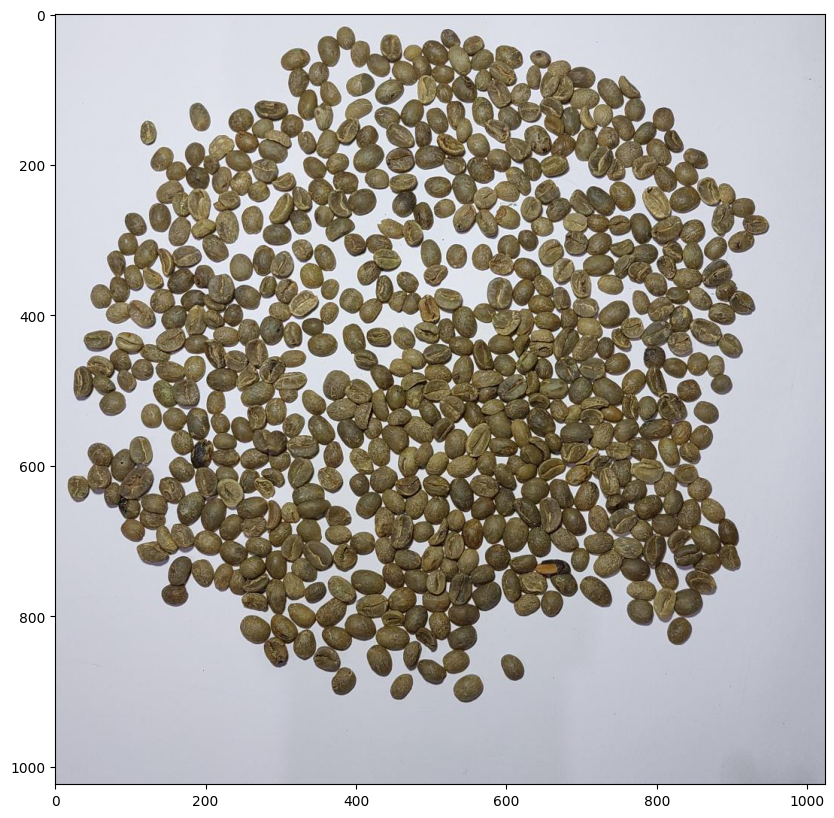

In [25]:
# Let's take a look at the dataset image
img = mmcv.imread('manual_dataset/images/30_1_jpg.rf.279dee5e9aff19d260c2156556bef6b1.png')
plt.figure(figsize=(15, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

In [26]:
# Check the label of a single image
!cat manual_dataset/train/30_1_jpg.rf.279dee5e9aff19d260c2156556bef6b1.txt

181 565 210.5 565 210.5 603.5 181 603.5 hitam 0
85 644 114.5 644 114.5 672 85 672 hitam-sebagian 0
639 724 686.5 724 686.5 749 639 749 kulit-kopi-kecil 0
784 441 811.5 441 811.5 471.5 784 471.5 hitam-sebagian 0

## Config Oriented RCNN (Tutorial)

In [5]:
# Buat nama direktori unik untuk setiap eksperimen
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
experiment_name = f"training__OrientedRCNN_{timestamp}"
output_dir = os.path.join("tutorial_exps", experiment_name)

# Pastikan direktori dibuat
os.makedirs(output_dir, exist_ok=True)

In [6]:
cfg = Config.fromfile('./configs/oriented_rcnn/oriented_rcnn_r50_fpn_1x_dota_le90.py')

In [7]:
# Modify dataset type and path
cfg.dataset_type = 'CoffeeDataset'
cfg.data_root = 'green-coffee-bean-defects-9-DOTA/'

cfg.data.test.type = 'CoffeeDataset'
cfg.data.test.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.test.ann_file = 'test'
cfg.data.test.img_prefix = 'images'

cfg.data.train.type = 'CoffeeDataset'
cfg.data.train.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.train.ann_file = 'train'
cfg.data.train.img_prefix = 'images'

cfg.data.val.type = 'CoffeeDataset'
cfg.data.val.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.val.ann_file = 'valid'
cfg.data.val.img_prefix = 'images'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch
cfg.load_from = 'pretrained/oriented_rcnn_r50_fpn_1x_dota_le90-6d2b2ce0.pth'

# Set up working dir to save files and logs.
cfg.work_dir = output_dir

cfg.optimizer.lr = 0.001
cfg.lr_config.warmup = None
cfg.runner.max_epochs = 5
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 1
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 3

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.device='cuda'

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'CoffeeDataset'
data_root = 'green-coffee-bean-defects-9-DOTA/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(type='RResize', img_scale=(1024, 1024)),
    dict(
        type='RRandomFlip',
        flip_ratio=[0.25, 0.25, 0.25],
        direction=['horizontal', 'vertical', 'diagonal'],
        version='le90'),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size_divisor=32),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels'])
]
test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        flip=False,
        transforms=[
            dict(type='RResize'),
            dic

In [8]:
# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

/usr/local/lib/python3.11/dist-packages/mmdet/models/dense_heads/anchor_head.py:116: UserWarning: DeprecationWarning: `num_anchors` is deprecated, for consistency or also use `num_base_priors` instead
  warnings.warn('DeprecationWarning: `num_anchors` is deprecated, '
2025-01-11 09:33:09,982 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2025-01-11 09:33:10,668 - mmdet - INFO - load checkpoint from local path: pretrained/oriented_rcnn_r50_fpn_1x_dota_le90-6d2b2ce0.pth
2025-01-11 09:33:11,266 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([16, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([16]) from checkpoint, the shape in current model is torch.Size([4]).
2025-01-11 09:33:11,276 - mmdet - INFO - Start running, host: root@c7a

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 18.9 task/s, elapsed: 4s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 17.4 task/s, elapsed: 5s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 16.9 task/s, elapsed: 5s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 18.9 task/s, elapsed: 4s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 17.1 task/s, elapsed: 5s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

In [16]:
# load tensorboard
%reload_ext tensorboard

In [ ]:
# Menampilkan grafik training lokal
%tensorboard --logdir ./tutorial_exps

In [ ]:
# Jalankan command berikut jika ingin menjalankan ulang tensorboard
# !pkill -f tensorboard

# Menampilkan grafik training runpod, sesuai route nya contoh:
# tensorboard --logdir=tutorial_exps/training__LSKNet-S_20250105_030552 --port=6007 --bind_all
%tensorboard --logdir=./tutorial_exps/{...} --port=6007 --bind_all

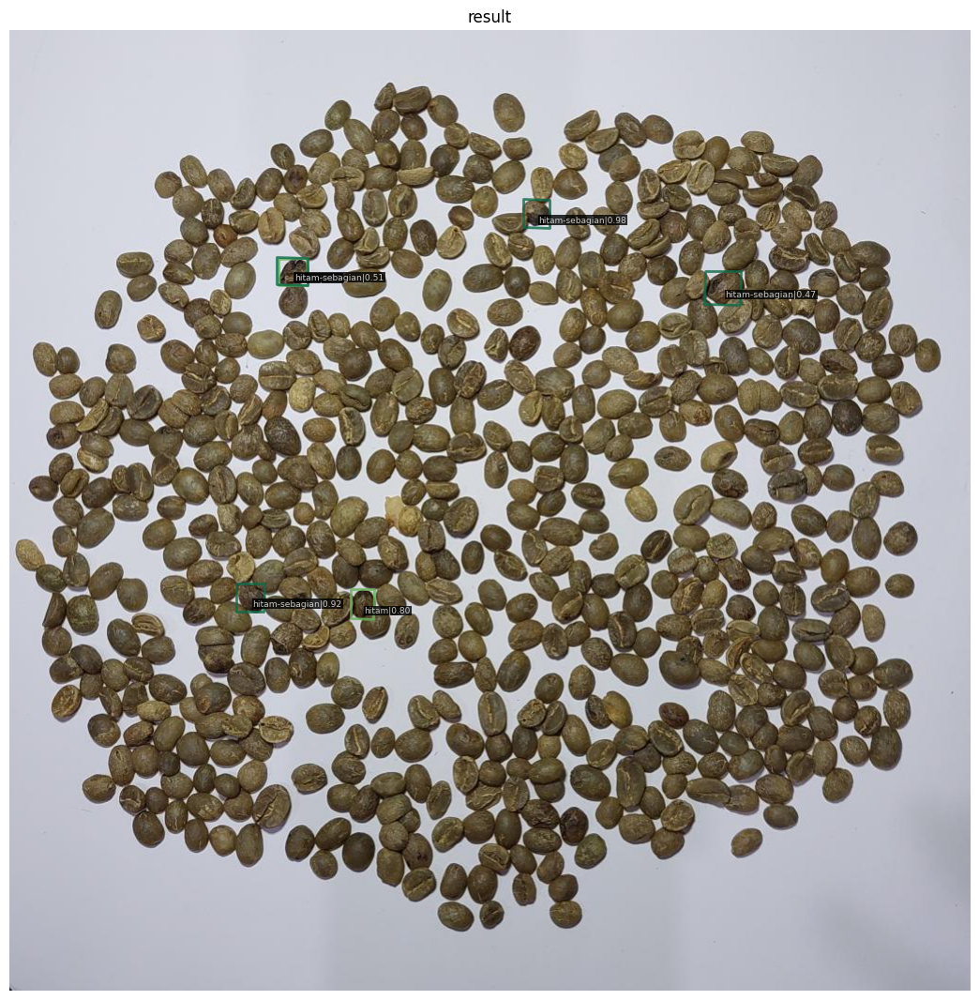

Hasil deteksi disimpan di: output/output_30_245_jpg.rf.5bc3e3ff70aeb00f0f52a12617d5ff12.png


In [36]:
# Folder gambar dan folder output
image_folder = 'manual_dataset/images/'
output_folder = 'output/'

# Buat folder output jika belum ada
os.makedirs(output_folder, exist_ok=True)

# Ambil daftar semua gambar dalam folder
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Pilih gambar secara acak jika ada gambar di dalam folder
if image_files:
    random_image = random.choice(image_files)  # Pilih gambar secara random
    image_path = os.path.join(image_folder, random_image)
else:
    # Jika tidak ada gambar, gunakan gambar default atau munculkan error
    image_path = 'manual_dataset/images/30_1_jpg.rf.279dee5e9aff19d260c2156556bef6b1.png'
    print("⚠️ Tidak ada gambar dalam folder, menggunakan file default!")

# Baca gambar
img = mmcv.imread(image_path)

# Konfigurasi model
model.cfg = cfg

# Lakukan deteksi objek
result = inference_detector(model, img)

# Tampilkan hasil dengan threshold score 0.3
show_result_pyplot(model, img, result, score_thr=0.3)

# Simpan hasil di folder output dengan nama berdasarkan gambar input
output_file = os.path.join(output_folder, f"output_{os.path.basename(image_path)}")
model.show_result(img, result, score_thr=0.3, out_file=output_file)

print(f"Hasil deteksi disimpan di: {output_file}")

In [37]:
# Folder input dan output
input_folder = 'manual_dataset/images'
output_folder = 'hasil_predict/config_tutorial'

# Pastikan folder output ada
os.makedirs(output_folder, exist_ok=True)

# Ambil semua file gambar di folder input
image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Pilih 10 gambar secara acak
random_images = random.sample(image_files, min(10, len(image_files)))

# Prediksi dan simpan hasilnya
for img_name in random_images:
    # Path lengkap untuk gambar input dan output
    input_path = os.path.join(input_folder, img_name)
    output_path = os.path.join(output_folder, f'pred_{img_name}')

    # Baca gambar
    img = mmcv.imread(input_path)

    # Lakukan prediksi
    result = inference_detector(model, img)

    # Simpan hasil prediksi
    model.show_result(img, result, score_thr=0.3, out_file=output_path)

    print(f"Hasil prediksi disimpan: {output_path}")

print("Prediksi selesai untuk 10 gambar acak.")

Hasil prediksi disimpan: hasil_predict/config_tutorial/pred_30_228_jpg.rf.af381673848b91d46b9e6dce1cb1e5ad.png
Hasil prediksi disimpan: hasil_predict/config_tutorial/pred_40_103_jpg.rf.bc3e98d6b6b466f47cbdc5d954e4510b.png
Hasil prediksi disimpan: hasil_predict/config_tutorial/pred_30_303_jpg.rf.1159c93299c683da79da516ba5f5ee3b.png
Hasil prediksi disimpan: hasil_predict/config_tutorial/pred_30_187_jpg.rf.a93145e4b6fe08f5c47a9a8a04000a3f.png
Hasil prediksi disimpan: hasil_predict/config_tutorial/pred_30_199_jpg.rf.029e1ad58291e088d854f323dd944dfb.png
Hasil prediksi disimpan: hasil_predict/config_tutorial/pred_30_235_jpg.rf.8cb9681b317a0f6fb4724ee70437d4a1.png
Hasil prediksi disimpan: hasil_predict/config_tutorial/pred_30_283_jpg.rf.6f11f0d0640db4fd8cae1eb44c8698ba.png
Hasil prediksi disimpan: hasil_predict/config_tutorial/pred_30_201_jpg.rf.fe6efc00cca4427904ff53e56730c54d.png
Hasil prediksi disimpan: hasil_predict/config_tutorial/pred_30_258_jpg.rf.c15660d321cc3c0d907bf2582d5ecac4.png
H

## Config LSKNet-T

In [17]:
# Buat nama direktori unik untuk setiap eksperimen
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
experiment_name = f"training__LSKNet-T_{timestamp}"
output_dir = os.path.join("tutorial_exps", experiment_name)

# Pastikan direktori dibuat
os.makedirs(output_dir, exist_ok=True)

In [18]:
cfg = Config.fromfile('./configs/lsknet/lsk_t_fpn_1x_dota_le90.py')

In [19]:
# Modify dataset type and path
cfg.dataset_type = 'CoffeeDataset'
cfg.data_root = 'green-coffee-bean-defects-9-DOTA/'

cfg.data.test.type = 'CoffeeDataset'
cfg.data.test.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.test.ann_file = 'test'
cfg.data.test.img_prefix = 'images'

cfg.data.train.type = 'CoffeeDataset'
cfg.data.train.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.train.ann_file = 'train'
cfg.data.train.img_prefix = 'images'

cfg.data.val.type = 'CoffeeDataset'
cfg.data.val.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.val.ann_file = 'valid'
cfg.data.val.img_prefix = 'images'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch

# Pre trained lskNet-S
cfg.load_from = 'pretrained/lsk_t_fpn_1x_dota_le90_20230206-3ccee254.pth'

# Set up working dir to save files and logs.
cfg.work_dir = output_dir

cfg.optimizer.lr = 0.0001
cfg.lr_config.warmup = 'linear'
cfg.lr_config.warmup_iters = 500
cfg.lr_config.warmup_ratio = 0.001
cfg.lr_config.policy = 'step'
cfg.lr_config.step = [3]  # Turunkan learning rate setelah epoch ke-3

cfg.runner.max_epochs = 5
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 1
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 3

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.device='cuda'

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'CoffeeDataset'
data_root = 'green-coffee-bean-defects-9-DOTA/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(type='RResize', img_scale=(1024, 1024)),
    dict(
        type='RRandomFlip',
        flip_ratio=[0.25, 0.25, 0.25],
        direction=['horizontal', 'vertical', 'diagonal'],
        version='le90'),
    dict(
        type='PolyRandomRotate',
        rotate_ratio=0.5,
        angles_range=180,
        auto_bound=False,
        rect_classes=[9, 11],
        version='le90'),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size_divisor=32),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels'])
]
test_pipeline = [
    dict(type='LoadImageFr

In [20]:
# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

2025-01-11 10:24:43,773 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2025-01-11 10:24:44,520 - mmdet - INFO - load checkpoint from local path: pretrained/lsk_t_fpn_1x_dota_le90_20230206-3ccee254.pth
2025-01-11 10:24:44,854 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([16, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([16]) from checkpoint, the shape in current model is torch.Size([4]).
2025-01-11 10:24:44,862 - mmdet - INFO - Start running, host: root@c7acc6c102c9, work_dir: /workspace/TelU-Tubes-TugasAkhir-LSKNet/tutorial_exps/training__LSKNet-T_20250111_102434
2025-01-11 10:24:44,863 - mmdet - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) StepLrUpdaterHook                  
(NORMAL    

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 20.3 task/s, elapsed: 4s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 18.2 task/s, elapsed: 4s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 18.2 task/s, elapsed: 4s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 18.8 task/s, elapsed: 4s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 18.4 task/s, elapsed: 4s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

In [11]:
# load tensorboard
%reload_ext tensorboard

In [12]:
# Menampilkan grafik training lokal
%tensorboard --logdir ./tutorial_exps

In [16]:
# Jalankan command berikut jika ingin menjalankan ulang tensorboard
!pkill -f tensorboard

# Menampilkan grafik training runpod, sesuai route nya contoh:
# tensorboard --logdir=tutorial_exps/training__LSKNet-S_20250105_030552 --port=6007 --bind_all
%tensorboard --logdir=./tutorial_exps/training__LSKNet-T_20250111_073658 --port=6007 --bind_all

/usr/local/lib/python3.11/dist-packages/mmdet/models/dense_heads/anchor_head.py:123: UserWarning: DeprecationWarning: anchor_generator is deprecated, please use "prior_generator" instead
  warnings.warn('DeprecationWarning: anchor_generator is deprecated, '


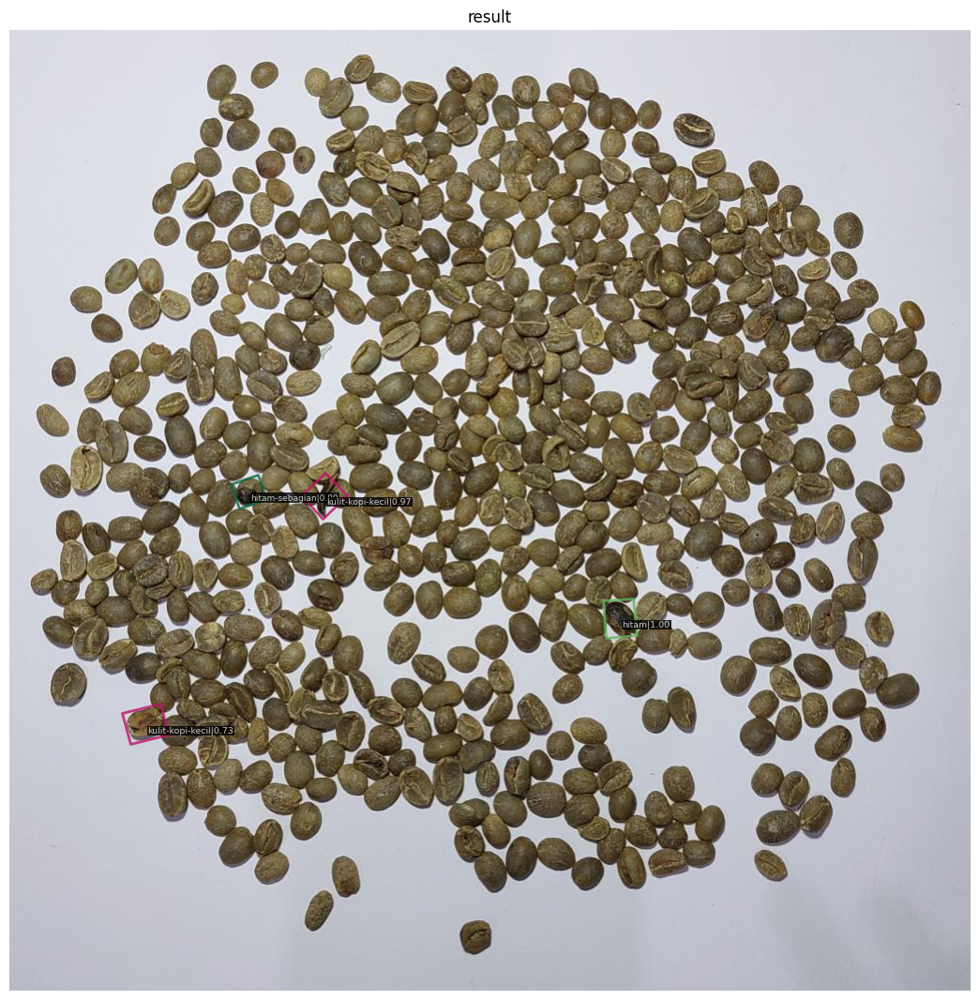

Hasil deteksi disimpan di: output/output_30_228_jpg.rf.af381673848b91d46b9e6dce1cb1e5ad.png


In [14]:
# Folder gambar dan folder output
image_folder = 'manual_dataset/images/'
output_folder = 'output/'

# Buat folder output jika belum ada
os.makedirs(output_folder, exist_ok=True)

# Ambil daftar semua gambar dalam folder
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Pilih gambar secara acak jika ada gambar di dalam folder
if image_files:
    random_image = random.choice(image_files)  # Pilih gambar secara random
    image_path = os.path.join(image_folder, random_image)
else:
    # Jika tidak ada gambar, gunakan gambar default atau munculkan error
    image_path = 'manual_dataset/images/30_1_jpg.rf.279dee5e9aff19d260c2156556bef6b1.png'
    print("⚠️ Tidak ada gambar dalam folder, menggunakan file default!")

# Baca gambar
img = mmcv.imread(image_path)

# Konfigurasi model
model.cfg = cfg

# Lakukan deteksi objek
result = inference_detector(model, img)

# Tampilkan hasil dengan threshold score 0.3
show_result_pyplot(model, img, result, score_thr=0.3)

# Simpan hasil di folder output dengan nama berdasarkan gambar input
output_file = os.path.join(output_folder, f"output_{os.path.basename(image_path)}")
model.show_result(img, result, score_thr=0.3, out_file=output_file)

print(f"Hasil deteksi disimpan di: {output_file}")

In [40]:

# Folder input dan output
input_folder = 'manual_dataset/images'
output_folder = 'hasil_predict/config_LSKNet-T'

# Pastikan folder output ada
os.makedirs(output_folder, exist_ok=True)

# Ambil semua file gambar di folder input
image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Pilih 10 gambar secara acak
random_images = random.sample(image_files, min(10, len(image_files)))

# Prediksi dan simpan hasilnya
for img_name in random_images:
    # Path lengkap untuk gambar input dan output
    input_path = os.path.join(input_folder, img_name)
    output_path = os.path.join(output_folder, f'pred_{img_name}')

    # Baca gambar
    img = mmcv.imread(input_path)

    # Lakukan prediksi
    result = inference_detector(model, img)

    # Simpan hasil prediksi
    model.show_result(img, result, score_thr=0.3, out_file=output_path)

    print(f"Hasil prediksi disimpan: {output_path}")

print("Prediksi selesai untuk 10 gambar acak.")

Hasil prediksi disimpan: hasil_predict/pred_30_254_jpg.rf.f224042101a165598937857e82935abb.png
Hasil prediksi disimpan: hasil_predict/pred_40_101_jpg.rf.7c5870b10792fcdf4d780baa2d62d9f2.png
Hasil prediksi disimpan: hasil_predict/pred_30_232_jpg.rf.35050409c019428f058a9a25851ad269.png
Hasil prediksi disimpan: hasil_predict/pred_30_289_jpg.rf.5ff50c5dab2af53664c2992919e90108.png
Hasil prediksi disimpan: hasil_predict/pred_30_273_jpg.rf.8be2d7b0760a2140cccf7d168044b1e9.png
Hasil prediksi disimpan: hasil_predict/pred_30_179_jpg.rf.24d82fd404ae9cbc7a9ed190b4e5be00.png
Hasil prediksi disimpan: hasil_predict/pred_30_50_jpg.rf.1a81e397fc103631701097789312d986.png
Hasil prediksi disimpan: hasil_predict/pred_30_194_jpg.rf.4ef372ec1d684b1c3c30a11a42d6f81d.png
Hasil prediksi disimpan: hasil_predict/pred_40_102_jpg.rf.3acdf48d7b1e7164bd6ffb96cee5d55a.png
Hasil prediksi disimpan: hasil_predict/pred_30_38_jpg.rf.53fab8674139f06029e59797cfff239d.png
Prediksi selesai untuk 10 gambar acak.


## Config LSKNet-S

In [24]:
# Buat nama direktori unik untuk setiap eksperimen
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
experiment_name = f"training__LSKNet-S_{timestamp}"
output_dir = os.path.join("tutorial_exps", experiment_name)

# Pastikan direktori dibuat
os.makedirs(output_dir, exist_ok=True)

In [25]:
cfg = Config.fromfile('./configs/lsknet/lsk_s_ema_fpn_1x_dota_le90.py')

In [26]:
# Modify dataset type and path
cfg.dataset_type = 'CoffeeDataset'
cfg.data_root = 'green-coffee-bean-defects-9-DOTA/'

cfg.data.test.type = 'CoffeeDataset'
cfg.data.test.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.test.ann_file = 'test'
cfg.data.test.img_prefix = 'images'

cfg.data.train.type = 'CoffeeDataset'
cfg.data.train.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.train.ann_file = 'train'
cfg.data.train.img_prefix = 'images'

cfg.data.val.type = 'CoffeeDataset'
cfg.data.val.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.val.ann_file = 'valid'
cfg.data.val.img_prefix = 'images'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch

# Pre trained lskNet-S
cfg.load_from = 'pretrained/lsk_s_ema_fpn_1x_dota_le90_20230212-30ed4041.pth'

# Set up working dir to save files and logs.
cfg.work_dir = output_dir

cfg.optimizer.lr = 0.0001
cfg.lr_config.warmup = 'linear'
cfg.lr_config.warmup_iters = 500
cfg.lr_config.warmup_ratio = 0.001
cfg.lr_config.policy = 'step'
cfg.lr_config.step = [3]  # Turunkan learning rate setelah epoch ke-3

cfg.runner.max_epochs = 5
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 1
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 3

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.device='cuda'

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'CoffeeDataset'
data_root = 'green-coffee-bean-defects-9-DOTA/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(type='RResize', img_scale=(1024, 1024)),
    dict(
        type='RRandomFlip',
        flip_ratio=[0.25, 0.25, 0.25],
        direction=['horizontal', 'vertical', 'diagonal'],
        version='le90'),
    dict(
        type='PolyRandomRotate',
        rotate_ratio=0.5,
        angles_range=180,
        auto_bound=False,
        rect_classes=[9, 11],
        version='le90'),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size_divisor=32),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels'])
]
test_pipeline = [
    dict(type='LoadImageFr

In [27]:
# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

2025-01-11 10:36:43,475 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2025-01-11 10:36:44,184 - mmdet - INFO - load checkpoint from local path: pretrained/lsk_s_ema_fpn_1x_dota_le90_20230212-30ed4041.pth
2025-01-11 10:36:44,975 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([16, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([16]) from checkpoint, the shape in current model is torch.Size([4]).
unexpected key in source state_dict: ema_backbone_patch_embed1_proj_weight, ema_backbone_patch_embed1_proj_bias, ema_backbone_patch_embed1_norm_weight, ema_backbone_patch_embed1_norm_bias, ema_backbone_patch_embed1_norm_running_mean, ema_backbone_patch_embed1_norm_running_var, ema_backbone_patch_embed1_norm_num_batches_tracked, ema_back

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 18.3 task/s, elapsed: 4s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 17.9 task/s, elapsed: 4s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 16.8 task/s, elapsed: 5s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 17.0 task/s, elapsed: 5s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 16.2 task/s, elapsed: 5s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

In [ ]:
# load tensorboard
%reload_ext tensorboard

In [ ]:
# Menampilkan grafik training lokal
%tensorboard --logdir ./tutorial_exps

In [ ]:
# Jalankan command berikut jika ingin menjalankan ulang tensorboard
# !pkill -f tensorboard

# Menampilkan grafik training runpod, sesuai route nya contoh:
# tensorboard --logdir=tutorial_exps/training__LSKNet-S_20250105_030552 --port=6007 --bind_all
%tensorboard --logdir=./tutorial_exps/{...} --port=6007 --bind_all

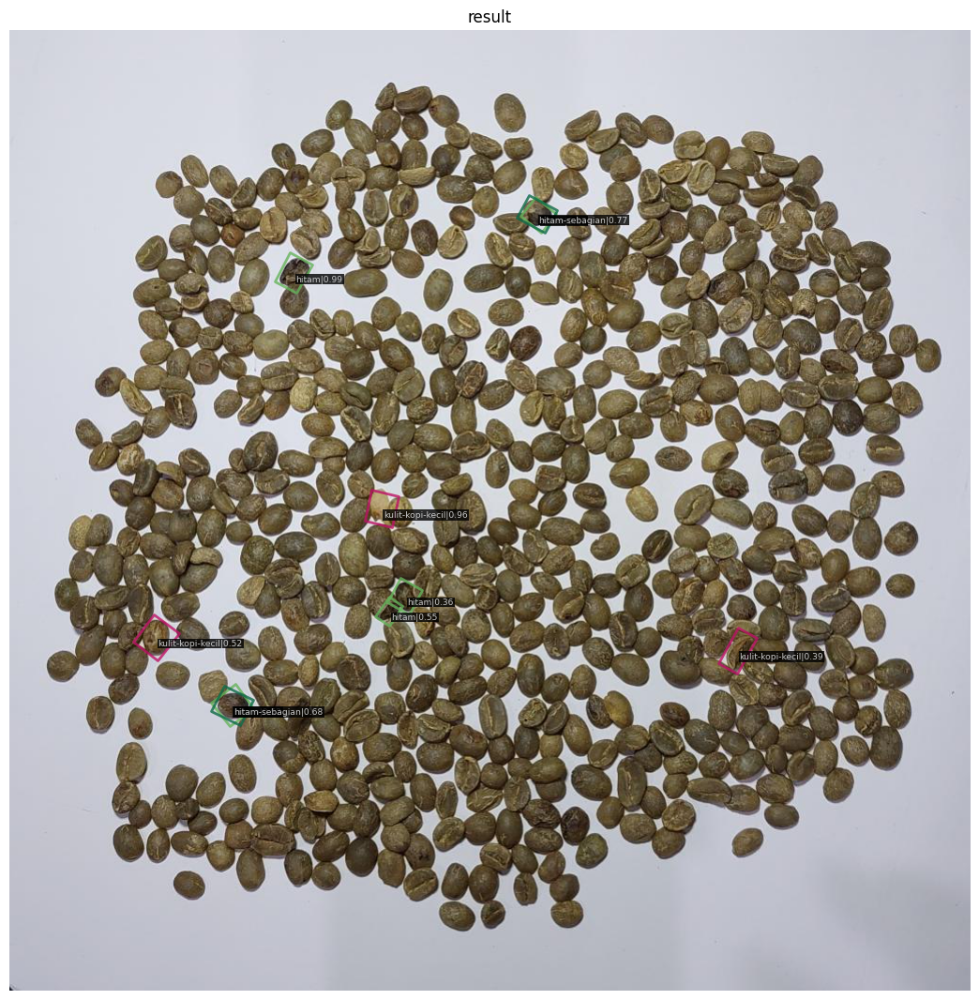

Hasil deteksi disimpan di: output/output_30_153_jpg.rf.82f368546b00c3a3918b87f8111eb942.png


In [29]:
# Folder gambar dan folder output
image_folder = 'manual_dataset/images/'
output_folder = 'output/'

# Buat folder output jika belum ada
os.makedirs(output_folder, exist_ok=True)

# Ambil daftar semua gambar dalam folder
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Pilih gambar secara acak jika ada gambar di dalam folder
if image_files:
    random_image = random.choice(image_files)  # Pilih gambar secara random
    image_path = os.path.join(image_folder, random_image)
else:
    # Jika tidak ada gambar, gunakan gambar default atau munculkan error
    image_path = 'manual_dataset/images/30_1_jpg.rf.279dee5e9aff19d260c2156556bef6b1.png'
    print("⚠️ Tidak ada gambar dalam folder, menggunakan file default!")

# Baca gambar
img = mmcv.imread(image_path)

# Konfigurasi model
model.cfg = cfg

# Lakukan deteksi objek
result = inference_detector(model, img)

# Tampilkan hasil dengan threshold score 0.3
show_result_pyplot(model, img, result, score_thr=0.3)

# Simpan hasil di folder output dengan nama berdasarkan gambar input
output_file = os.path.join(output_folder, f"output_{os.path.basename(image_path)}")
model.show_result(img, result, score_thr=0.3, out_file=output_file)

print(f"Hasil deteksi disimpan di: {output_file}")

In [30]:
# Folder input dan output
input_folder = 'manual_dataset/images'
output_folder = 'hasil_predict/LSKNet-S'

# Pastikan folder output ada
os.makedirs(output_folder, exist_ok=True)

# Ambil semua file gambar di folder input
image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Pilih 10 gambar secara acak
random_images = random.sample(image_files, min(10, len(image_files)))

# Prediksi dan simpan hasilnya
for img_name in random_images:
    # Path lengkap untuk gambar input dan output
    input_path = os.path.join(input_folder, img_name)
    output_path = os.path.join(output_folder, f'pred_{img_name}')

    # Baca gambar
    img = mmcv.imread(input_path)

    # Lakukan prediksi
    result = inference_detector(model, img)

    # Simpan hasil prediksi
    model.show_result(img, result, score_thr=0.3, out_file=output_path)

    print(f"Hasil prediksi disimpan: {output_path}")

print("Prediksi selesai untuk 10 gambar acak.")

Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_322_jpg.rf.b025e08176fca0f041031bf64633df6e.png
Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_18_jpg.rf.f87d71408374bfc192f5cdbb5cc27376.png
Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_57_jpg.rf.795e5e46ac73bb2df419b26aeb22e907.png
Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_293_jpg.rf.61fcdc5983164f5d379d53d02544ff07.png
Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_78_jpg.rf.53049cfbadb674fe1f15f0c190292420.png
Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_137_jpg.rf.927c81152f09264a50d764587ec6b8a7.png
Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_307_jpg.rf.5dcfa492a2e6849ee16da0efb937f50b.png
Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_177_jpg.rf.aaebab84a2900da1a103214d030df0f5.png
Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_144_jpg.rf.920faadcc2df842baaeb59f13a2f339b.png
Hasil prediksi disimpan: hasil_predict/LSKNet-S/pred_30_53_jpg.rf.2

# Proses training (NEW)

## Config LSKNet-T

### Training

In [50]:
# Buat nama direktori unik untuk setiap eksperimen
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
experiment_name = f"training__LSKNet-T_{timestamp}"
output_dir = os.path.join("tutorial_exps", experiment_name)

# Pastikan direktori dibuat
os.makedirs(output_dir, exist_ok=True)

In [51]:
cfg = Config.fromfile('./configs/lsknet/lsk_t_fpn_1x_dota_le90.py')

In [52]:
# Modify dataset type and path
cfg.dataset_type = 'CoffeeDataset'
cfg.data_root = 'green-coffee-bean-defects-9-DOTA/'

cfg.data.test.type = 'CoffeeDataset'
cfg.data.test.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.test.ann_file = 'test'
cfg.data.test.img_prefix = 'images'

cfg.data.train.type = 'CoffeeDataset'
cfg.data.train.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.train.ann_file = 'train'
cfg.data.train.img_prefix = 'images'

cfg.data.val.type = 'CoffeeDataset'
cfg.data.val.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.val.ann_file = 'valid'
cfg.data.val.img_prefix = 'images'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch

# Pre trained lskNet-S
cfg.load_from = 'pretrained/lsk_t_fpn_1x_dota_le90_20230206-3ccee254.pth'

# Set up working dir to save files and logs.
cfg.work_dir = output_dir

cfg.optimizer.lr = 0.0001
cfg.lr_config.warmup = 'linear'
cfg.lr_config.warmup_iters = 500
cfg.lr_config.warmup_ratio = 0.001
cfg.lr_config.policy = 'step'
cfg.lr_config.step = [3]  # Turunkan learning rate setelah epoch ke-3

cfg.runner.max_epochs = 5
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 1
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 1

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.device='cuda'

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'CoffeeDataset'
data_root = 'green-coffee-bean-defects-9-DOTA/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(type='RResize', img_scale=(1024, 1024)),
    dict(
        type='RRandomFlip',
        flip_ratio=[0.25, 0.25, 0.25],
        direction=['horizontal', 'vertical', 'diagonal'],
        version='le90'),
    dict(
        type='PolyRandomRotate',
        rotate_ratio=0.5,
        angles_range=180,
        auto_bound=False,
        rect_classes=[9, 11],
        version='le90'),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size_divisor=32),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels'])
]
test_pipeline = [
    dict(type='LoadImageFr

In [53]:
# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

2025-01-13 11:44:10,691 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2025-01-13 11:44:11,089 - mmdet - INFO - load checkpoint from local path: pretrained/lsk_t_fpn_1x_dota_le90_20230206-3ccee254.pth
2025-01-13 11:44:11,271 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([16, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([16]) from checkpoint, the shape in current model is torch.Size([4]).
2025-01-13 11:44:11,272 - mmdet - INFO - Start running, host: root@4dd1ef83e882, work_dir: /workspace/TelU-Tubes-TugasAkhir-LSKNet/tutorial_exps/training__LSKNet-T_20250113_114400
2025-01-13 11:44:11,272 - mmdet - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) StepLrUpdaterHook                  
(NORMAL    

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 39.5 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 36.9 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 43.0 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 41.4 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 42.9 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

### Evaluation

In [54]:
from mmdet.apis import single_gpu_test, multi_gpu_test, inference_detector
from mmcv.runner import load_checkpoint
from mmdet.datasets import build_dataloader, build_dataset
from mmcv import Config
import torch
import mmcv
import os

In [55]:
# Load dataset evaluasi
datasets_eval = build_dataset(cfg.data.test)
dataloader = build_dataloader(datasets_eval, samples_per_gpu=1, workers_per_gpu=2, dist=False, shuffle=False)

In [56]:
from mmdet.models import build_detector

checkpoint_path = 'tutorial_exps/training__LSKNet-T_20250113_114400/epoch_5.pth'  # Sesuaikan dengan path model hasil training

model = build_detector(cfg.model, test_cfg=cfg.get('test_cfg'))
checkpoint = load_checkpoint(model, checkpoint_path, map_location='cpu')

# Menentukan model dalam mode evaluasi
model.CLASSES = datasets_eval.CLASSES  # Menyesuaikan kelas dengan dataset
model = model.cuda()  # Gunakan GPU jika tersedia
model.eval()

load checkpoint from local path: tutorial_exps/training__LSKNet-T_20250113_114400/epoch_5.pth


OrientedRCNN(
  (backbone): LSKNet(
    (patch_embed1): OverlapPatchEmbed(
      (proj): Conv2d(3, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      (norm): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (block1): ModuleList(
      (0): Block(
        (norm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (norm2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (attn): Attention(
          (proj_1): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
          (activation): GELU(approximate='none')
          (spatial_gating_unit): LSKblock(
            (conv0): Conv2d(32, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), groups=32)
            (conv_spatial): Conv2d(32, 32, kernel_size=(7, 7), stride=(1, 1), padding=(9, 9), dilation=(3, 3), groups=32)
            (conv1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1))
            (conv2): Conv2d(

In [57]:
from mmcv.parallel import MMDataParallel

model = MMDataParallel(model, device_ids=[0])  # Untuk single GPU

outputs = single_gpu_test(model, dataloader, show_score_thr=0.3)  # Testing

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 199/199, 43.6 task/s, elapsed: 5s, ETA:     0s

In [58]:
eval_results = datasets_eval.evaluate(outputs, metric=['mAP'])  # Sesuaikan dengan jenis task (deteksi atau segmentasi)
print(eval_results)

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components


+------------------+-----+------+--------+-------+
| class            | gts | dets | recall | ap    |
+------------------+-----+------+--------+-------+
| hitam            | 264 | 1048 | 0.966  | 0.854 |
| hitam-sebagian   | 261 | 1187 | 0.958  | 0.770 |
| kulit-kopi-kecil | 195 | 510  | 0.985  | 0.895 |
+------------------+-----+------+--------+-------+
| mAP              |     |      |        | 0.840 |
+------------------+-----+------+--------+-------+
{'mAP': 0.8397185802459717}


## Config LSKNet-S

### Training

In [103]:
# Buat nama direktori unik untuk setiap eksperimen
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
experiment_name = f"training__LSKNet-S_{timestamp}"
output_dir = os.path.join("tutorial_exps", experiment_name)

# Pastikan direktori dibuat
os.makedirs(output_dir, exist_ok=True)

In [104]:
cfg = Config.fromfile('./configs/lsknet/lsk_s_ema_fpn_1x_dota_le90.py')

In [105]:
# Modify dataset type and path
cfg.dataset_type = 'CoffeeDataset'
cfg.data_root = 'green-coffee-bean-defects-9-DOTA/'

cfg.data.test.type = 'CoffeeDataset'
cfg.data.test.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.test.ann_file = 'test'
cfg.data.test.img_prefix = 'images'

cfg.data.train.type = 'CoffeeDataset'
cfg.data.train.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.train.ann_file = 'train'
cfg.data.train.img_prefix = 'images'

cfg.data.val.type = 'CoffeeDataset'
cfg.data.val.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.val.ann_file = 'valid'
cfg.data.val.img_prefix = 'images'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch

# Pre trained lskNet-S
cfg.load_from = 'pretrained/lsk_s_ema_fpn_1x_dota_le90_20230212-30ed4041.pth'

# Set up working dir to save files and logs.
cfg.work_dir = output_dir

cfg.optimizer.lr = 0.0001
cfg.lr_config.warmup = 'linear'
cfg.lr_config.warmup_iters = 500
cfg.lr_config.warmup_ratio = 0.001
cfg.lr_config.policy = 'step'
cfg.lr_config.step = [3]  # Turunkan learning rate setelah epoch ke-3

cfg.runner.max_epochs = 5
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 1
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 1

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.device='cuda'

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'CoffeeDataset'
data_root = 'green-coffee-bean-defects-9-DOTA/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(type='RResize', img_scale=(1024, 1024)),
    dict(
        type='RRandomFlip',
        flip_ratio=[0.25, 0.25, 0.25],
        direction=['horizontal', 'vertical', 'diagonal'],
        version='le90'),
    dict(
        type='PolyRandomRotate',
        rotate_ratio=0.5,
        angles_range=180,
        auto_bound=False,
        rect_classes=[9, 11],
        version='le90'),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size_divisor=32),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels'])
]
test_pipeline = [
    dict(type='LoadImageFr

In [106]:
# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

2025-01-13 12:24:22,517 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2025-01-13 12:24:23,188 - mmdet - INFO - load checkpoint from local path: pretrained/lsk_s_ema_fpn_1x_dota_le90_20230212-30ed4041.pth
2025-01-13 12:24:23,659 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([16, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([16]) from checkpoint, the shape in current model is torch.Size([4]).
unexpected key in source state_dict: ema_backbone_patch_embed1_proj_weight, ema_backbone_patch_embed1_proj_bias, ema_backbone_patch_embed1_norm_weight, ema_backbone_patch_embed1_norm_bias, ema_backbone_patch_embed1_norm_running_mean, ema_backbone_patch_embed1_norm_running_var, ema_backbone_patch_embed1_norm_num_batches_tracked, ema_back

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 38.3 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 38.5 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 38.3 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 38.1 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 38.0 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

### Evaluation

In [121]:
from mmdet.apis import single_gpu_test, multi_gpu_test, inference_detector
from mmcv.runner import load_checkpoint
from mmdet.datasets import build_dataloader, build_dataset
from mmcv import Config
import torch
import mmcv
import os

In [122]:
# Load dataset evaluasi
datasets_eval = build_dataset(cfg.data.test)
dataloader = build_dataloader(datasets_eval, samples_per_gpu=1, workers_per_gpu=2, dist=False, shuffle=False)

In [123]:
from mmdet.models import build_detector

checkpoint_path = 'tutorial_exps/training__LSKNet-S_20250113_122415/latest.pth'  # Sesuaikan dengan path model hasil training

model = build_detector(cfg.model, test_cfg=cfg.get('test_cfg'))
checkpoint = load_checkpoint(model, checkpoint_path, map_location='cpu')

# Menentukan model dalam mode evaluasi
model.CLASSES = datasets_eval.CLASSES  # Menyesuaikan kelas dengan dataset
model = model.cuda()  # Gunakan GPU jika tersedia
model.eval()

load checkpoint from local path: tutorial_exps/training__LSKNet-S_20250113_122415/latest.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: ema_backbone_patch_embed1_proj_weight, ema_backbone_patch_embed1_proj_bias, ema_backbone_patch_embed1_norm_weight, ema_backbone_patch_embed1_norm_bias, ema_backbone_patch_embed1_norm_running_mean, ema_backbone_patch_embed1_norm_running_var, ema_backbone_patch_embed1_norm_num_batches_tracked, ema_backbone_block1_0_layer_scale_1, ema_backbone_block1_0_layer_scale_2, ema_backbone_block1_0_norm1_weight, ema_backbone_block1_0_norm1_bias, ema_backbone_block1_0_norm1_running_mean, ema_backbone_block1_0_norm1_running_var, ema_backbone_block1_0_norm1_num_batches_tracked, ema_backbone_block1_0_norm2_weight, ema_backbone_block1_0_norm2_bias, ema_backbone_block1_0_norm2_running_mean, ema_backbone_block1_0_norm2_running_var, ema_backbone_block1_0_norm2_num_batches_tracked, ema_backbone_block1_0_attn_proj_1_weight, ema

OrientedRCNN(
  (backbone): LSKNet(
    (patch_embed1): OverlapPatchEmbed(
      (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      (norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (block1): ModuleList(
      (0): Block(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (norm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (attn): Attention(
          (proj_1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
          (activation): GELU(approximate='none')
          (spatial_gating_unit): LSKblock(
            (conv0): Conv2d(64, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), groups=64)
            (conv_spatial): Conv2d(64, 64, kernel_size=(7, 7), stride=(1, 1), padding=(9, 9), dilation=(3, 3), groups=64)
            (conv1): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (conv2): Conv2d(

In [124]:
from mmcv.parallel import MMDataParallel

model = MMDataParallel(model, device_ids=[0])  # Untuk single GPU

outputs = single_gpu_test(model, dataloader, show_score_thr=0.3)  # Testing

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 199/199, 40.9 task/s, elapsed: 5s, ETA:     0s

In [125]:
eval_results = datasets_eval.evaluate(outputs, metric=['mAP'])  # Sesuaikan dengan jenis task (deteksi atau segmentasi)
print(eval_results)

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components


+------------------+-----+------+--------+-------+
| class            | gts | dets | recall | ap    |
+------------------+-----+------+--------+-------+
| hitam            | 264 | 472  | 0.928  | 0.849 |
| hitam-sebagian   | 261 | 625  | 0.908  | 0.775 |
| kulit-kopi-kecil | 195 | 548  | 0.990  | 0.902 |
+------------------+-----+------+--------+-------+
| mAP              |     |      |        | 0.842 |
+------------------+-----+------+--------+-------+
{'mAP': 0.8420052528381348}


## Create Graph

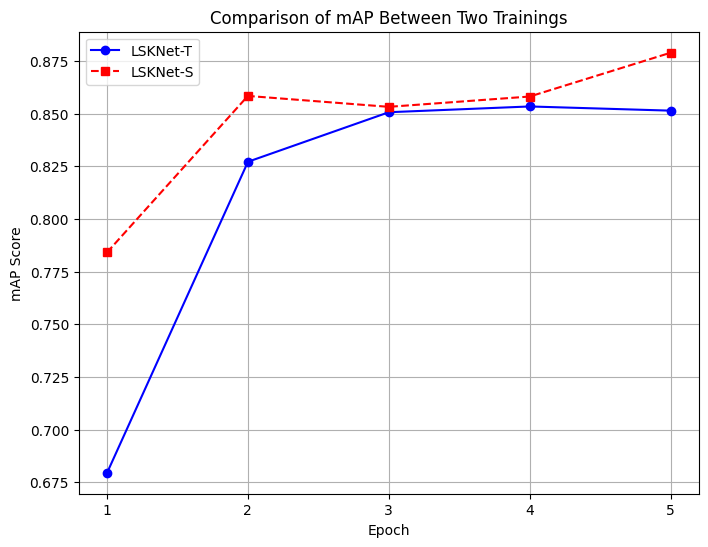

In [126]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

# Path ke dua folder TensorBoard logs
log_dirs = {
    "Training A": "tutorial_exps/training__LSKNet-T_20250113_114400/tf_logs/",  # Sesuaikan dengan path log pertama
    "Training B": "tutorial_exps/training__LSKNet-S_20250113_122415/tf_logs"   # Sesuaikan dengan path log kedua
}

# Maksimum epoch (sesuaikan dengan jumlah epoch dari training)
max_epochs = 5

# Fungsi untuk membaca TensorBoard log
def extract_map(log_dir):
    event_files = []
    for root, dirs, files in os.walk(log_dir):
        for file in files:
            if "events.out.tfevents" in file:
                event_files.append(os.path.join(root, file))

    data = []
    for file in event_files:
        event_acc = EventAccumulator(file)
        event_acc.Reload()  # Load data

        # Pastikan "val/mAP" ada di scalars
        if "val/mAP" in event_acc.Tags()["scalars"]:
            for event in event_acc.Scalars("val/mAP"):
                data.append((event.step, event.value))

    df = pd.DataFrame(data, columns=["Step", "mAP"])
    df = df.sort_values(by="Step")

    # Normalisasi step menjadi epoch
    df["Epoch"] = (df["Step"] / df["Step"].max()) * max_epochs
    return df

# Membaca data dari kedua training
df_a = extract_map(log_dirs["Training A"])
df_b = extract_map(log_dirs["Training B"])

# Plot kedua mAP
plt.figure(figsize=(8, 6))
plt.plot(df_a["Epoch"], df_a["mAP"], marker="o", linestyle="-", label="LSKNet-T", color="blue")
plt.plot(df_b["Epoch"], df_b["mAP"], marker="s", linestyle="--", label="LSKNet-S", color="red")

plt.xlabel("Epoch")
plt.ylabel("mAP Score")
plt.title("Comparison of mAP Between Two Trainings")
plt.xticks(range(1, max_epochs + 1))  # Pastikan hanya menampilkan epoch yang valid
plt.legend()
plt.grid(True)
plt.savefig("grafik/comparison_map.png", dpi=300, bbox_inches="tight")  # Simpan sebagai PNG
plt.show()

## Inference menggunakan best model LSKNet

In [34]:
# Buat nama direktori unik untuk setiap eksperimen
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
experiment_name = f"training__LSKNet-S_{timestamp}"
output_dir = os.path.join("tutorial_exps", experiment_name)

# Pastikan direktori dibuat
os.makedirs(output_dir, exist_ok=True)

In [39]:
cfg = Config.fromfile('./configs/lsknet/lsk_s_ema_fpn_1x_dota_le90.py')

In [40]:
# Modify dataset type and path
cfg.dataset_type = 'CoffeeDataset'
cfg.data_root = 'green-coffee-bean-defects-9-DOTA/'

cfg.data.test.type = 'CoffeeDataset'
cfg.data.test.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.test.ann_file = 'test'
cfg.data.test.img_prefix = 'images'

cfg.data.train.type = 'CoffeeDataset'
cfg.data.train.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.train.ann_file = 'train'
cfg.data.train.img_prefix = 'images'

cfg.data.val.type = 'CoffeeDataset'
cfg.data.val.data_root = 'green-coffee-bean-defects-9-DOTA/'
cfg.data.val.ann_file = 'valid'
cfg.data.val.img_prefix = 'images'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch

# Pre trained lskNet-S
cfg.load_from = 'pretrained/lsk_s_ema_fpn_1x_dota_le90_20230212-30ed4041.pth'

# Set up working dir to save files and logs.
cfg.work_dir = output_dir

cfg.optimizer.lr = 0.0001
cfg.lr_config.warmup = 'linear'
cfg.lr_config.warmup_iters = 500
cfg.lr_config.warmup_ratio = 0.001
cfg.lr_config.policy = 'step'
cfg.lr_config.step = [3]  # Turunkan learning rate setelah epoch ke-3

cfg.runner.max_epochs = 5
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 1
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 1

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.device='cuda'

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
dataset_type = 'CoffeeDataset'
data_root = 'green-coffee-bean-defects-9-DOTA/'
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(type='RResize', img_scale=(1024, 1024)),
    dict(
        type='RRandomFlip',
        flip_ratio=[0.25, 0.25, 0.25],
        direction=['horizontal', 'vertical', 'diagonal'],
        version='le90'),
    dict(
        type='PolyRandomRotate',
        rotate_ratio=0.5,
        angles_range=180,
        auto_bound=False,
        rect_classes=[9, 11],
        version='le90'),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size_divisor=32),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_bboxes', 'gt_labels'])
]
test_pipeline = [
    dict(type='LoadImageFr

In [41]:
# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

2025-01-13 13:11:31,549 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2025-01-13 13:11:31,926 - mmdet - INFO - load checkpoint from local path: pretrained/lsk_s_ema_fpn_1x_dota_le90_20230212-30ed4041.pth
2025-01-13 13:11:32,416 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([16, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([16]) from checkpoint, the shape in current model is torch.Size([4]).
unexpected key in source state_dict: ema_backbone_patch_embed1_proj_weight, ema_backbone_patch_embed1_proj_bias, ema_backbone_patch_embed1_norm_weight, ema_backbone_patch_embed1_norm_bias, ema_backbone_patch_embed1_norm_running_mean, ema_backbone_patch_embed1_norm_running_var, ema_backbone_patch_embed1_norm_num_batches_tracked, ema_back

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 38.0 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 38.2 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 38.3 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 38.9 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 80/80, 39.7 task/s, elapsed: 2s, ETA:     0s

/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components

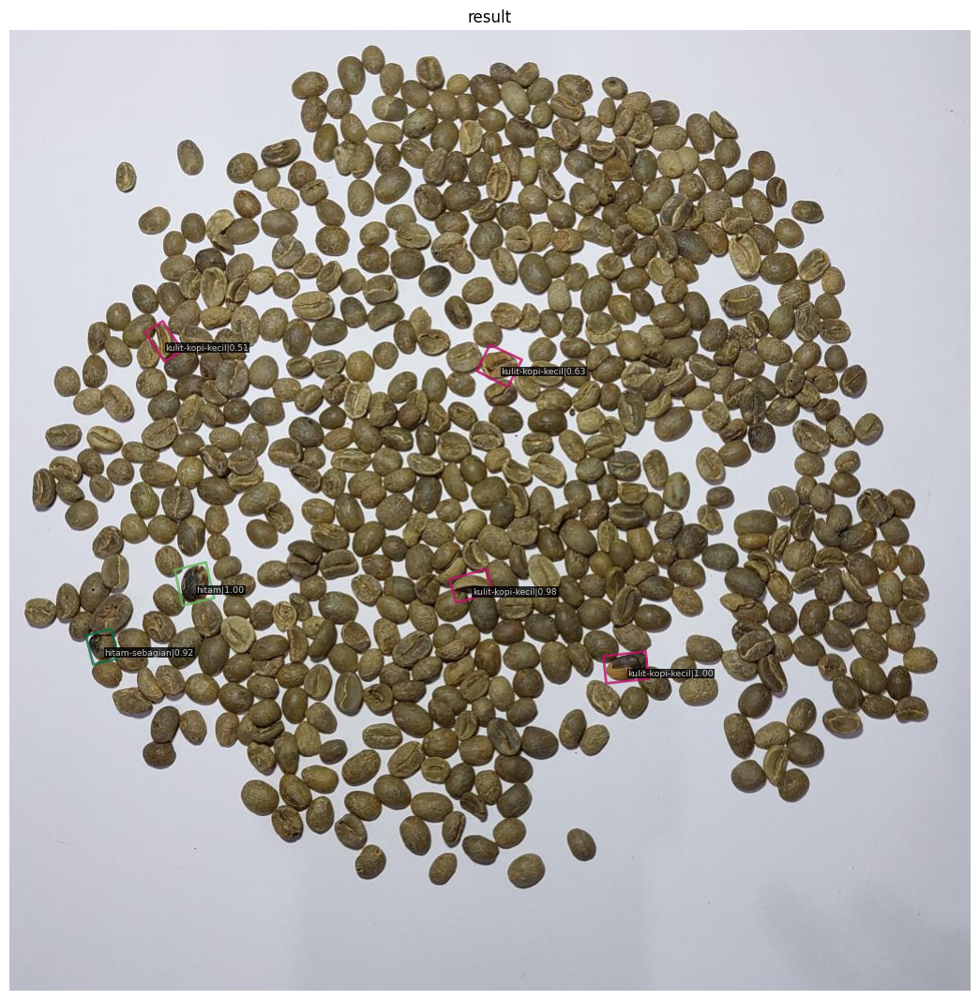

Hasil deteksi disimpan di: hasil_predict/LSKNet-S/output_30_123_jpg.rf.31212d045b8656152884fbd2f6f82021.jpg


In [42]:
# Folder gambar dan folder output
image_folder = 'green-coffee-bean-defects-11/test'
output_folder = 'hasil_predict/LSKNet-S'

# Buat folder output jika belum ada
os.makedirs(output_folder, exist_ok=True)

# Ambil daftar semua gambar dalam folder
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Pilih gambar secara acak jika ada gambar di dalam folder
if image_files:
    random_image = random.choice(image_files)  # Pilih gambar secara random
    image_path = os.path.join(image_folder, random_image)
else:
    # Jika tidak ada gambar, gunakan gambar default atau munculkan error
    image_path = 'manual_dataset/images/30_1_jpg.rf.279dee5e9aff19d260c2156556bef6b1.png'
    print("⚠️ Tidak ada gambar dalam folder, menggunakan file default!")

# Baca gambar
img = mmcv.imread(image_path)

# Konfigurasi model
model.cfg = cfg

# Lakukan deteksi objek
result = inference_detector(model, img)

# Tampilkan hasil dengan threshold score 0.3
show_result_pyplot(model, img, result, score_thr=0.3)

# Simpan hasil di folder output dengan nama berdasarkan gambar input
output_file = os.path.join(output_folder, f"output_{os.path.basename(image_path)}")
model.show_result(img, result, score_thr=0.3, out_file=output_file)

print(f"Hasil deteksi disimpan di: {output_file}")

In [43]:
# import os
# import mmcv
# import torch
# from mmdet.apis import inference_detector, init_detector
# from mmcv.runner import load_checkpoint
# from mmdet.models import build_detector
# from mmcv import Config

# # Load konfigurasi dan model dari checkpoint
# config_path = './configs/lsknet/lsk_s_ema_fpn_1x_dota_le90.py' # Sesuaikan dengan path konfigurasi Anda
# checkpoint_path = 'tutorial_exps/training__LSKNet-S_20250113_122415/latest.pth'  # Sesuaikan dengan path model hasil training

# cfg = Config.fromfile(config_path)
# model = build_detector(cfg.model, test_cfg=cfg.get('test_cfg'))
# load_checkpoint(model, checkpoint_path, map_location='cuda')  # Load checkpoint
# model.CLASSES =  datasets_eval.CLASSES  # Sesuaikan dengan kelas dataset Anda
# model = model.cuda()
# model.eval()

# Daftar folder input
input_folders = [
    'green-coffee-bean-defects-11/test',
    'green-coffee-bean-defects-12/test',
    'green-coffee-bean-defects-13/test'
]

# Folder output utama
output_base_folder = 'hasil_predict/LSKNet-S'

# model.cfg = cfg

# Loop untuk setiap folder input
for input_folder in input_folders:
    # Tentukan folder output berdasarkan nama input folder
    output_folder = os.path.join(output_base_folder, os.path.basename(os.path.dirname(input_folder)))
    
    # Pastikan folder output ada
    os.makedirs(output_folder, exist_ok=True)

    # Ambil semua file gambar dalam folder input
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Lakukan inferensi untuk setiap gambar dalam folder
    for img_name in image_files:
        # Path lengkap untuk gambar input dan output
        input_path = os.path.join(input_folder, img_name)
        output_path = os.path.join(output_folder, f'pred_{img_name}')

        # Baca gambar
        img = mmcv.imread(input_path)

        # Lakukan prediksi
        result = inference_detector(model, img)

        # Simpan hasil prediksi
        model.show_result(img, result, score_thr=0.3, out_file=output_path)

        print(f"Hasil prediksi disimpan: {output_path}")

print("Prediksi selesai untuk semua gambar di tiga folder.")

Hasil prediksi disimpan: hasil_predict/LSKNet-S/green-coffee-bean-defects-11/pred_30_1_jpg.rf.279dee5e9aff19d260c2156556bef6b1.jpg
Hasil prediksi disimpan: hasil_predict/LSKNet-S/green-coffee-bean-defects-11/pred_30_177_jpg.rf.aaebab84a2900da1a103214d030df0f5.jpg
Hasil prediksi disimpan: hasil_predict/LSKNet-S/green-coffee-bean-defects-11/pred_30_173_jpg.rf.c17f95782dd9f949afcdad58c725a649.jpg
Hasil prediksi disimpan: hasil_predict/LSKNet-S/green-coffee-bean-defects-11/pred_30_165_jpg.rf.720b037a7f3d6562f15504660ba601f5.jpg
Hasil prediksi disimpan: hasil_predict/LSKNet-S/green-coffee-bean-defects-11/pred_30_164_jpg.rf.a3806612de1c54fa1a901318e5786518.jpg
Hasil prediksi disimpan: hasil_predict/LSKNet-S/green-coffee-bean-defects-11/pred_30_15_jpg.rf.18f61ffdfa5d57c1f619fae025ad511d.jpg
Hasil prediksi disimpan: hasil_predict/LSKNet-S/green-coffee-bean-defects-11/pred_30_159_jpg.rf.dd5f82860084d0fd02c4cac06650d21a.jpg
Hasil prediksi disimpan: hasil_predict/LSKNet-S/green-coffee-bean-defect